In [1]:
# Cell 1: Imports & basic setup

import os
import time
import tarfile
from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms, utils
import matplotlib.pyplot as plt  # <--- add this

# Device & seed
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SEED = 42
torch.manual_seed(SEED)

print("Using device:", DEVICE)


Using device: cuda


In [14]:
# Cell 2: Hyperparameters, extract CIFAR-10, and DataLoader

# ===== Hyperparameters =====
IMG_SIZE     = 32          # CIFAR-10 is 32x32
IMG_CHANNELS = 3           # CIFAR-10 is RGB
Z_DIM        = 100         # Noise vector size
G_FEATURES   = 128         # a bit larger than before
D_FEATURES   = 64
LABEL_EMB    = 50          # label embedding
BATCH_SIZE   = 64
LR           = 2e-4        # classic DCGAN learning rate
EPOCHS       = 80          # ACGAN often needs more epochs
AUX_LAMBDA_D = 1.0         # weight of aux loss in D
AUX_LAMBDA_G = 1.0         # weight of aux loss in G

NUM_CLASSES  = 10          # CIFAR-10

from pathlib import Path
import tarfile

# ===== Data root & extraction =====
data_root = Path("data")
tar_path = data_root / "cifar-10-python.tar.gz"

if tar_path.exists():
    cifar_dir = data_root / "cifar-10-batches-py"
    if not cifar_dir.exists():
        print("Extracting cifar-10-python.tar.gz...")
        with tarfile.open(tar_path, "r:gz") as tar:
            tar.extractall(path=data_root)
    else:
        print("cifar-10-batches-py already extracted.")
else:
    print("WARNING: data/cifar-10-python.tar.gz not found.")
    print("torchvision will try to download CIFAR-10 for you.")

# ===== Transforms =====
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),  # 32 -> 32 (no real change, but safe)
    transforms.ToTensor(),
    transforms.Normalize([0.5] * IMG_CHANNELS, [0.5] * IMG_CHANNELS),
])

# ===== Dataset & DataLoader =====
download_flag = not (data_root / "cifar-10-batches-py").exists()

train_dataset = datasets.CIFAR10(
    root=str(data_root),
    train=True,
    transform=transform,
    download=download_flag
)

dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print(f"Found {len(train_dataset)} training images.")
print("Classes:", train_dataset.classes)
print("NUM_CLASSES =", NUM_CLASSES)


cifar-10-batches-py already extracted.
Found 50000 training images.
Classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
NUM_CLASSES = 10


In [15]:
# Cell 3: Generator tuned for CIFAR-10 (32x32)

class Generator(nn.Module):
    """
    Conditional ACGAN Generator for CIFAR-10 (32x32)
    """
    def __init__(self,
                 num_classes: int,
                 z_dim: int,
                 img_channels: int,
                 emb_dim: int,
                 g_features: int,
                 img_size: int):
        super().__init__()
        self.z_dim = z_dim
        self.img_size = img_size

        # label embedding
        self.label_embedding = nn.Embedding(num_classes, emb_dim)

        in_channels = z_dim + emb_dim  # concatenate z and label

        self.net = nn.Sequential(
            # (B, in_channels, 1, 1) -> (B, g_features*4, 4, 4)
            nn.ConvTranspose2d(in_channels, g_features * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(g_features * 4),
            nn.ReLU(True),

            # (B, g_features*4, 4, 4) -> (B, g_features*2, 8, 8)
            nn.ConvTranspose2d(g_features * 4, g_features * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(g_features * 2),
            nn.ReLU(True),

            # (B, g_features*2, 8, 8) -> (B, g_features, 16, 16)
            nn.ConvTranspose2d(g_features * 2, g_features, 4, 2, 1, bias=False),
            nn.BatchNorm2d(g_features),
            nn.ReLU(True),

            # (B, g_features, 16, 16) -> (B, img_channels, 32, 32)
            nn.ConvTranspose2d(g_features, img_channels, 4, 2, 1, bias=True),
            nn.Tanh(),
        )

    def forward(self, z, labels):
        # labels: (B,) -> (B, emb_dim)
        label_vec = self.label_embedding(labels)
        label_vec = label_vec.unsqueeze(2).unsqueeze(3)   # (B, emb_dim, 1, 1)
        x = torch.cat([z, label_vec], dim=1)             # (B, z_dim+emb_dim, 1, 1)
        img = self.net(x)
        return img


In [16]:
# Cell 4: Discriminator tuned for CIFAR-10 (32x32)

class Discriminator(nn.Module):
    """
    ACGAN Discriminator:
    - Shared conv backbone
    - adv_head: real/fake score
    - aux_head: class logits
    """
    def __init__(self,
                 num_classes: int,
                 img_channels: int,
                 d_features: int):
        super().__init__()
        self.num_classes = num_classes

        self.backbone = nn.Sequential(
            # (B, 3, 32, 32) -> (B, d_features, 16, 16)
            nn.Conv2d(img_channels, d_features, 4, 2, 1),
            nn.LeakyReLU(0.2, inplace=True),

            # (B, d_features, 16, 16) -> (B, d_features*2, 8, 8)
            nn.Conv2d(d_features, d_features * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_features * 2),
            nn.LeakyReLU(0.2, inplace=True),

            # (B, d_features*2, 8, 8) -> (B, d_features*4, 4, 4)
            nn.Conv2d(d_features * 2, d_features * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(d_features * 4),
            nn.LeakyReLU(0.2, inplace=True),
        )

        final_feat = d_features * 4 * 4 * 4  # (d_features*4, 4, 4)

        self.adv_head = nn.Linear(final_feat, 1)            # real/fake
        self.aux_head = nn.Linear(final_feat, num_classes)  # class

    def forward(self, x):
        features = self.backbone(x)
        features = features.view(features.size(0), -1)

        adv_out = self.adv_head(features).view(-1)  # (B,)
        class_out = self.aux_head(features)         # (B, num_classes)
        return adv_out, class_out


In [17]:
# Cell 5: Init weights and build models

def init_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.Linear, nn.BatchNorm2d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            nn.init.constant_(m.bias.data, 0)

G = Generator(
    num_classes=NUM_CLASSES,
    z_dim=Z_DIM,
    img_channels=IMG_CHANNELS,
    emb_dim=LABEL_EMB,
    g_features=G_FEATURES,
    img_size=IMG_SIZE
).to(DEVICE)

D = Discriminator(
    num_classes=NUM_CLASSES,
    img_channels=IMG_CHANNELS,
    d_features=D_FEATURES
).to(DEVICE)

G.apply(init_weights)
D.apply(init_weights)

print(G)
print(D)


Generator(
  (label_embedding): Embedding(10, 50)
  (net): Sequential(
    (0): ConvTranspose2d(150, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): Tanh()
  )
)
Discriminator(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 12

In [18]:
# Cell 6: Loss functions, optimizers, fixed noise, output dir

adv_criterion = nn.BCEWithLogitsLoss()
aux_criterion = nn.CrossEntropyLoss()

g_optimizer = optim.Adam(G.parameters(), lr=LR, betas=(0.5, 0.999))
d_optimizer = optim.Adam(D.parameters(), lr=LR, betas=(0.5, 0.999))

# Fixed noise for monitoring progress
fixed_noise = torch.randn(32, Z_DIM, 1, 1, device=DEVICE)

# Make output directory for generated images
os.makedirs("results/fake", exist_ok=True)


======== Training ACGAN on CIFAR-10 (32x32) ========
Epoch 1 finished: G=1.4406, D=2.9471


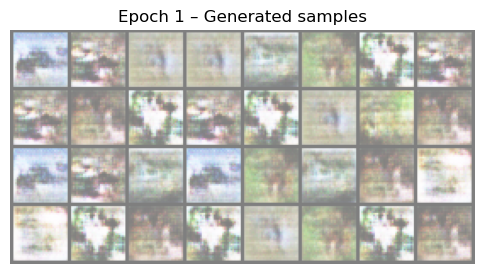

Epoch 2 finished: G=1.1689, D=2.6393


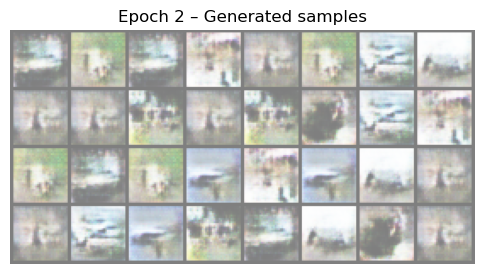

Epoch 3 finished: G=1.3088, D=2.4415


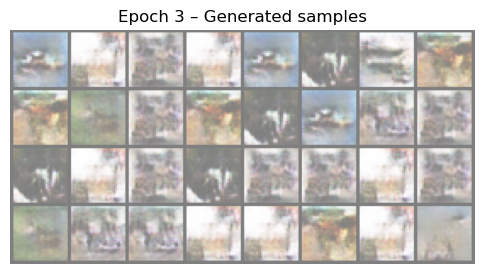

Epoch 4 finished: G=1.5147, D=2.2649


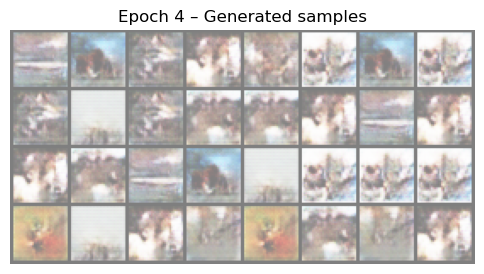

Epoch 5 finished: G=1.6713, D=2.1266


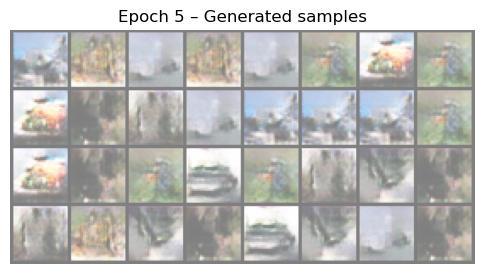

Epoch 6 finished: G=1.7943, D=2.0092


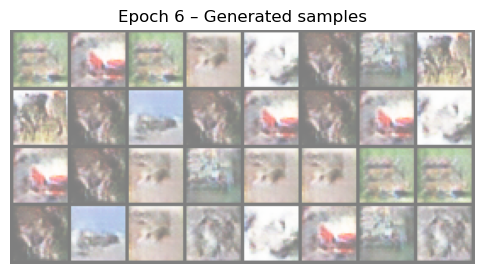

Epoch 7 finished: G=1.9560, D=1.8879


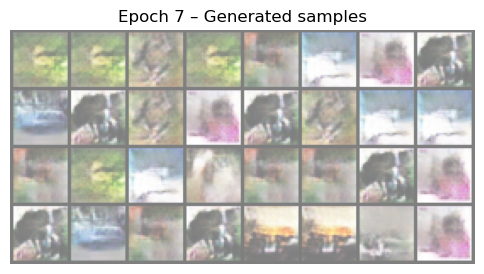

Epoch 8 finished: G=2.1197, D=1.7740


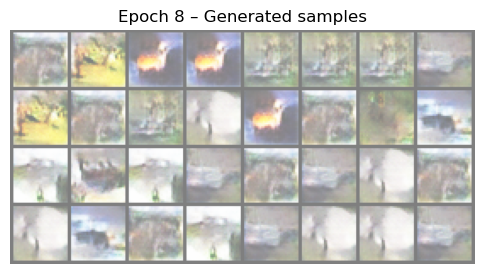

Epoch 9 finished: G=2.1439, D=1.7277


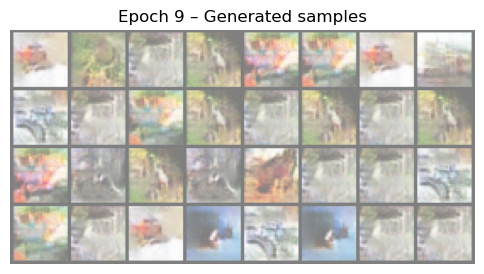

Epoch 10 finished: G=2.2063, D=1.6827


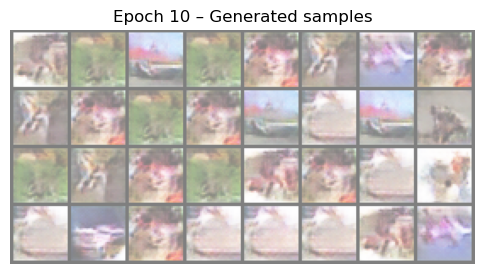

Epoch 11 finished: G=2.2331, D=1.6842


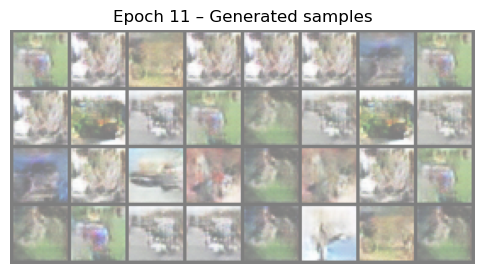

Epoch 12 finished: G=2.2036, D=1.6879


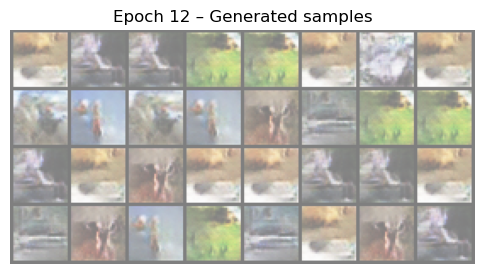

Epoch 13 finished: G=2.1996, D=1.7029


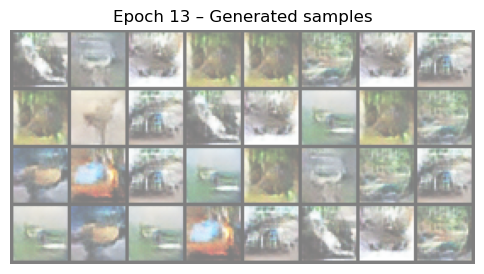

Epoch 14 finished: G=2.2496, D=1.6843


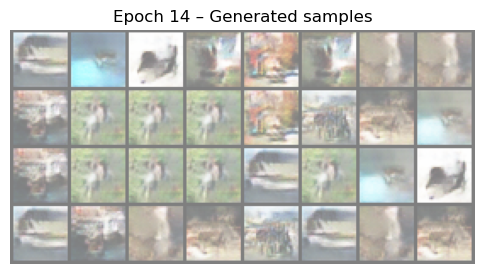

Epoch 15 finished: G=2.2433, D=1.6848


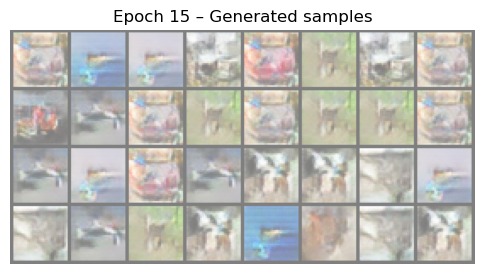

Epoch 16 finished: G=2.2637, D=1.6576


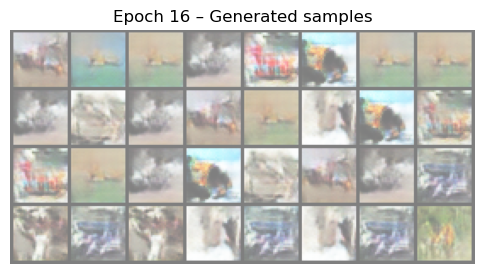

Epoch 17 finished: G=2.3058, D=1.6399


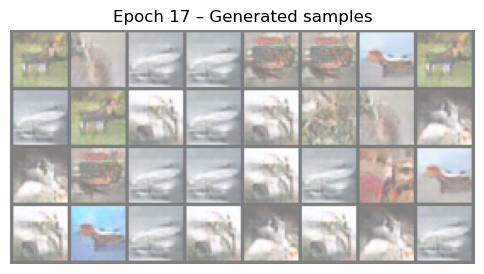

Epoch 18 finished: G=2.4406, D=1.5494


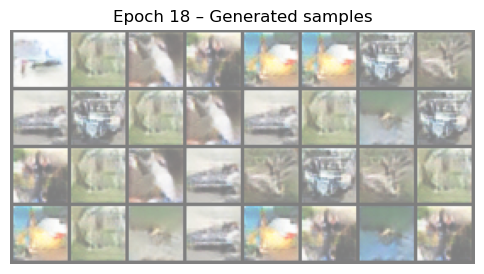

Epoch 19 finished: G=2.4360, D=1.5298


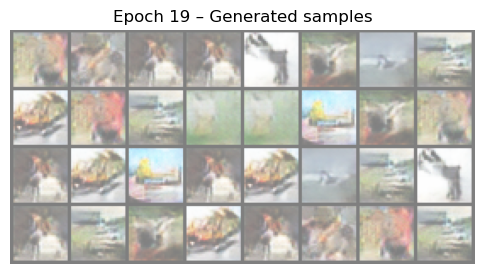

Epoch 20 finished: G=2.4374, D=1.5436


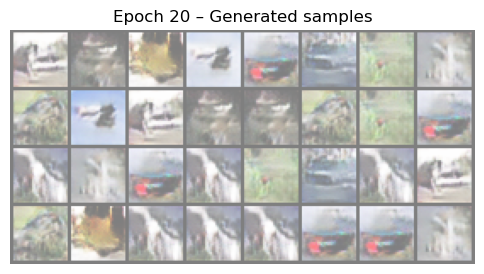

Epoch 21 finished: G=2.4443, D=1.5170


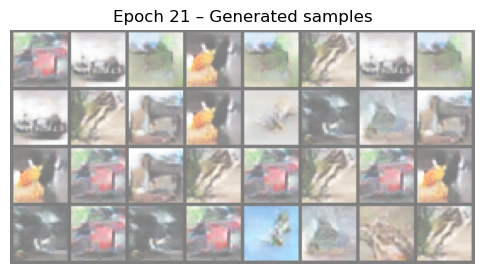

Epoch 22 finished: G=2.4896, D=1.4929


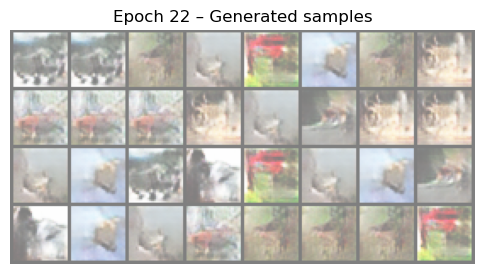

Epoch 23 finished: G=2.4333, D=1.5190


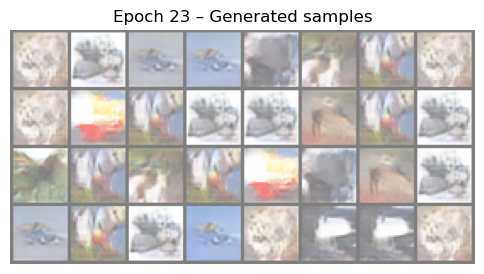

Epoch 24 finished: G=2.4989, D=1.5252


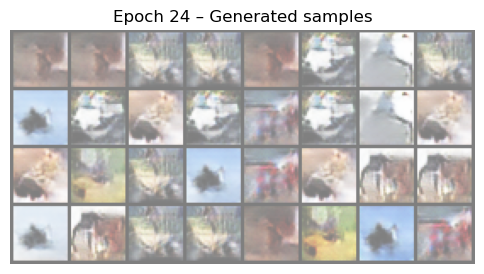

Epoch 25 finished: G=2.3759, D=1.5266


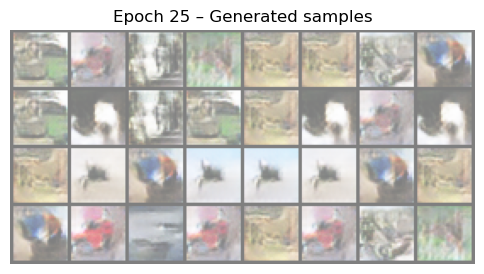

Epoch 26 finished: G=2.4286, D=1.5260


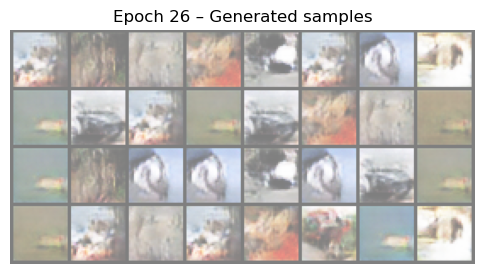

Epoch 27 finished: G=2.4718, D=1.4893


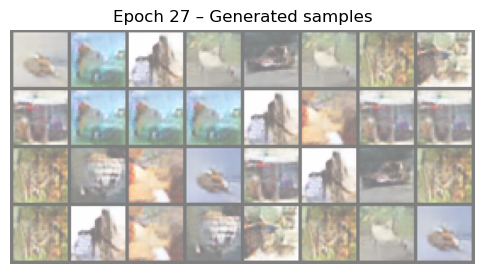

Epoch 28 finished: G=2.4932, D=1.4609


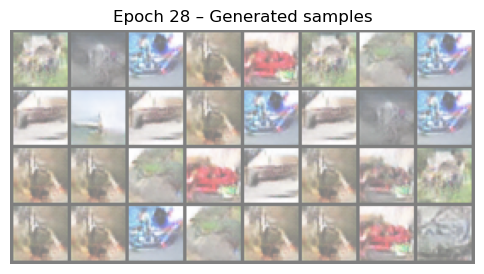

Epoch 29 finished: G=2.5705, D=1.4307


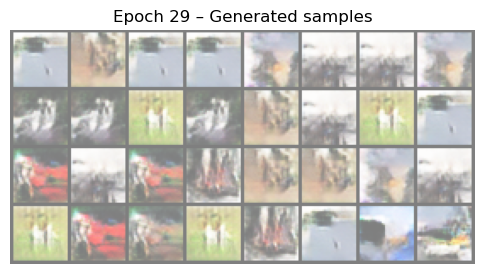

Epoch 30 finished: G=2.6040, D=1.4260


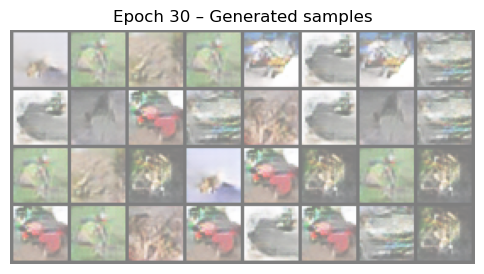

Epoch 31 finished: G=2.5771, D=1.4235


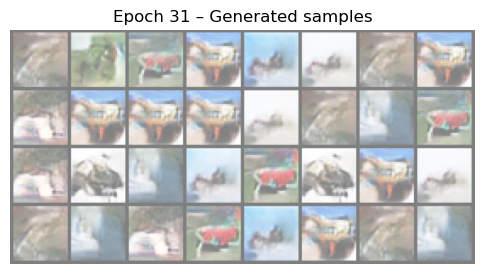

Epoch 32 finished: G=2.4877, D=1.4150


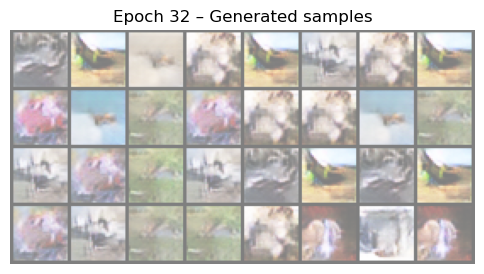

Epoch 33 finished: G=2.6841, D=1.3963


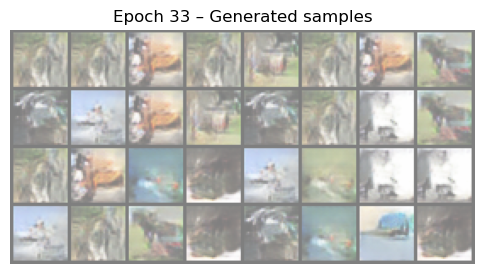

Epoch 34 finished: G=2.6341, D=1.3440


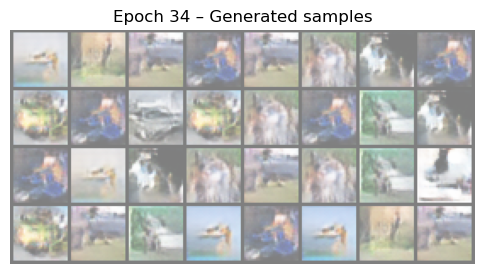

Epoch 35 finished: G=2.6183, D=1.3709


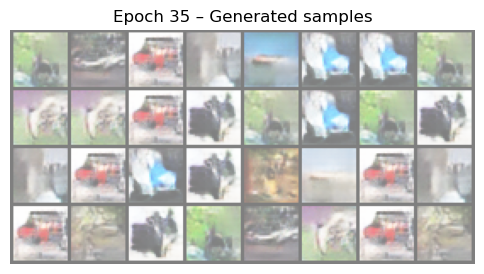

Epoch 36 finished: G=2.7323, D=1.3320


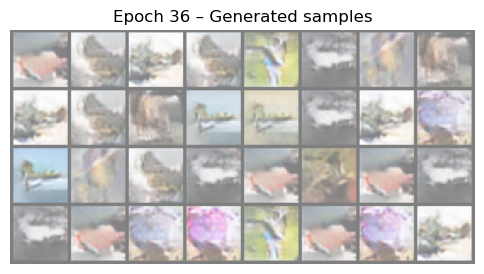

Epoch 37 finished: G=2.7013, D=1.3519


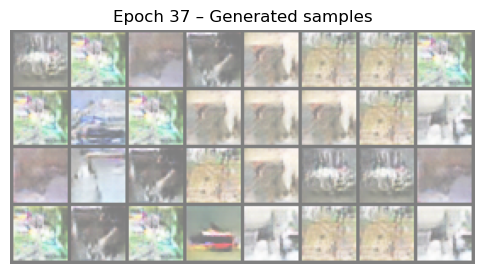

Epoch 38 finished: G=2.6594, D=1.3193


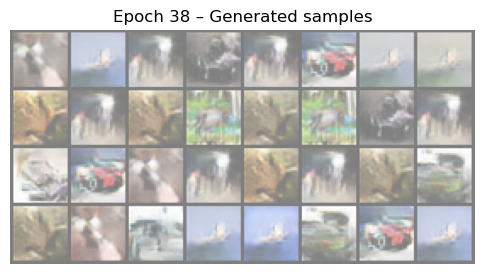

Epoch 39 finished: G=2.7324, D=1.3374


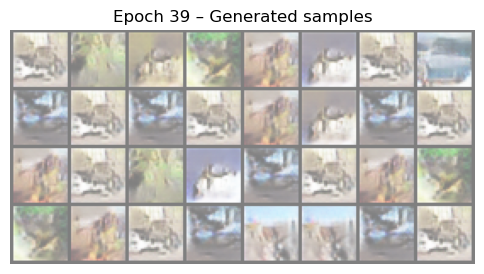

Epoch 40 finished: G=2.7177, D=1.3217


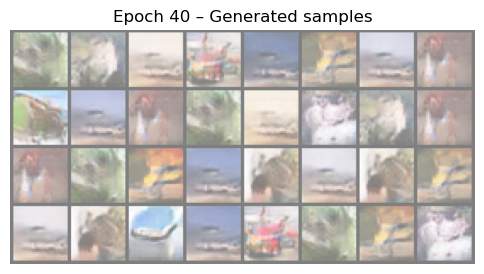

Epoch 41 finished: G=2.6649, D=1.3334


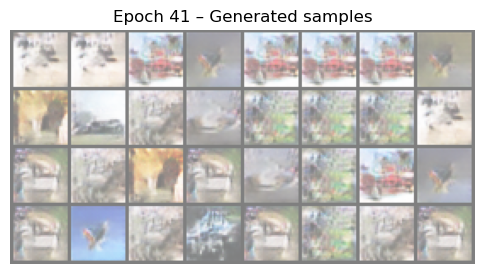

Epoch 42 finished: G=2.7296, D=1.3028


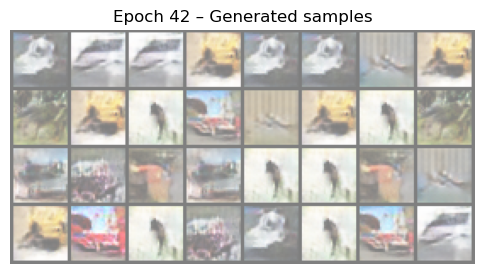

Epoch 43 finished: G=2.8261, D=1.3187


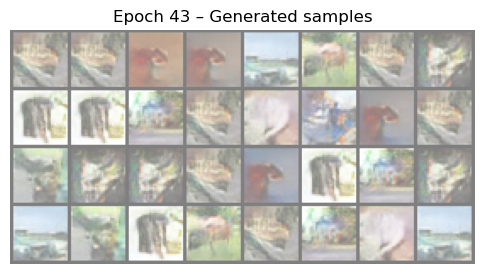

Epoch 44 finished: G=2.7748, D=1.2825


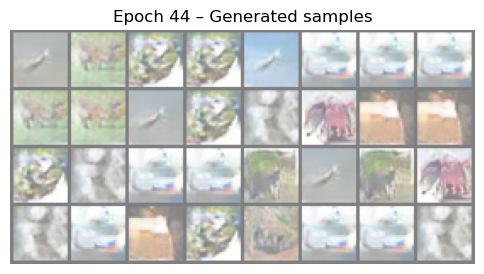

Epoch 45 finished: G=2.7853, D=1.2610


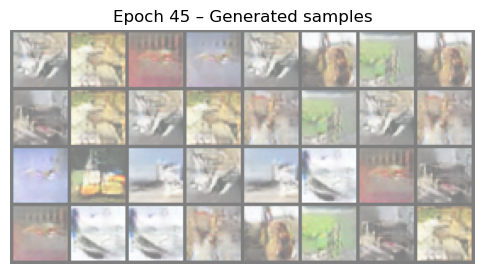

Epoch 46 finished: G=2.7592, D=1.2898


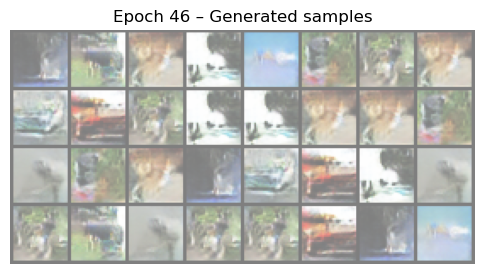

Epoch 47 finished: G=2.9000, D=1.2424


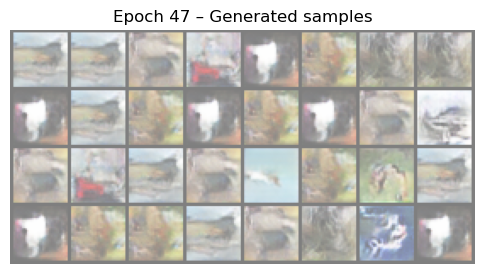

Epoch 48 finished: G=2.8738, D=1.2396


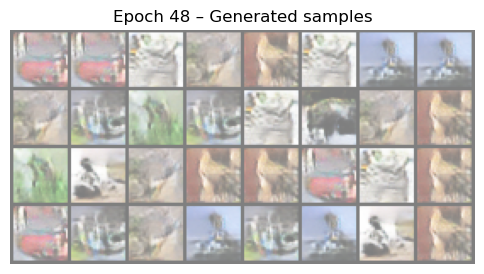

Epoch 49 finished: G=2.9084, D=1.2234


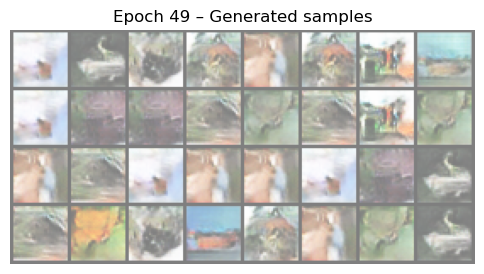

Epoch 50 finished: G=3.0366, D=1.1757


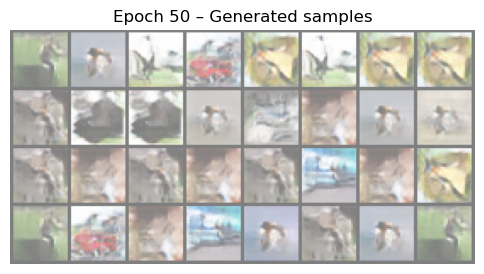

Epoch 51 finished: G=2.9631, D=1.1584


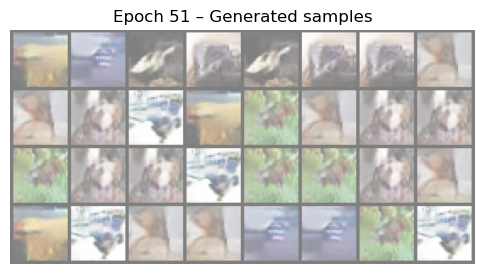

Epoch 52 finished: G=2.8765, D=1.1790


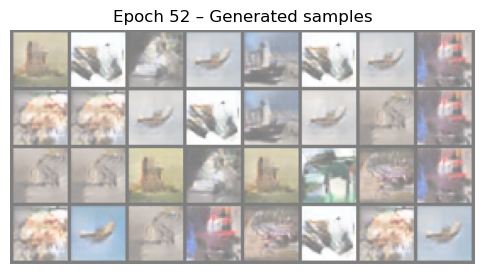

Epoch 53 finished: G=3.0383, D=1.1705


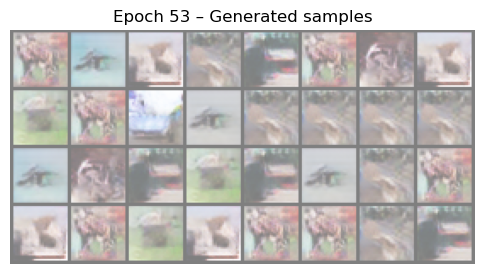

Epoch 54 finished: G=3.0173, D=1.1335


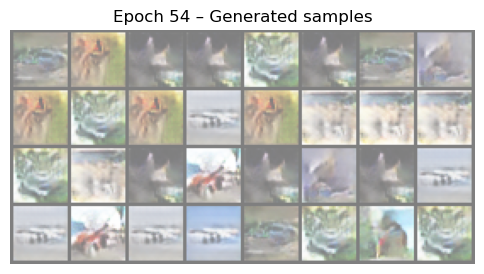

Epoch 55 finished: G=3.1447, D=1.1041


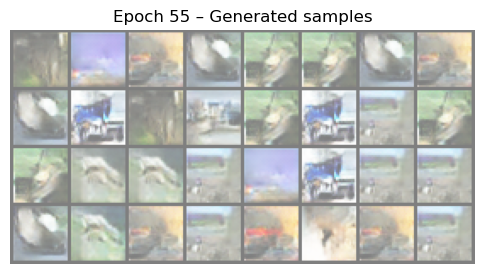

Epoch 56 finished: G=3.1687, D=1.1108


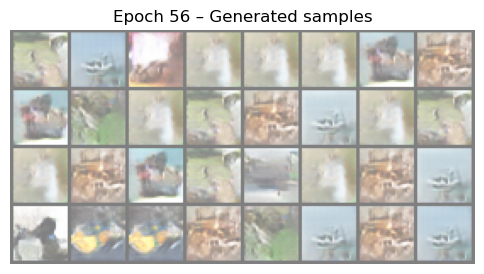

Epoch 57 finished: G=3.0878, D=1.0958


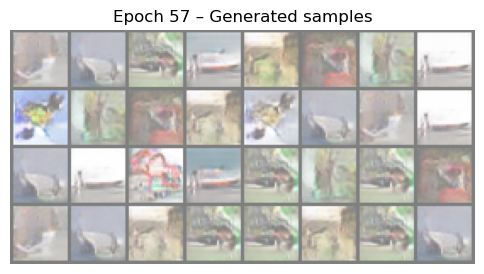

Epoch 58 finished: G=3.1399, D=1.0850


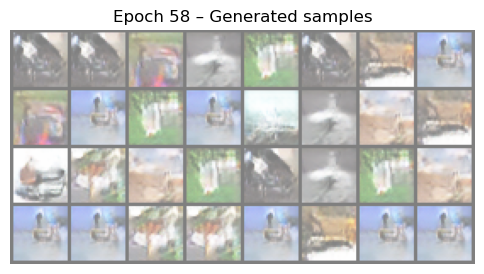

Epoch 59 finished: G=3.2583, D=1.0532


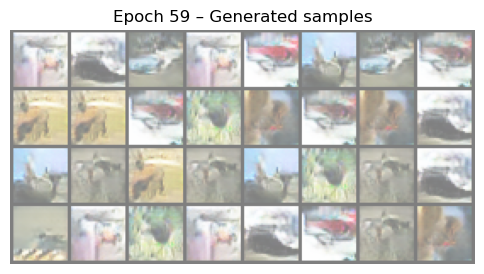

Epoch 60 finished: G=3.3243, D=1.0607


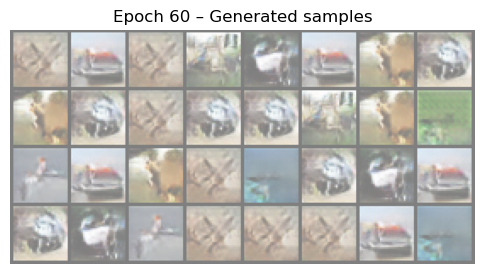

Epoch 61 finished: G=3.2319, D=1.0422


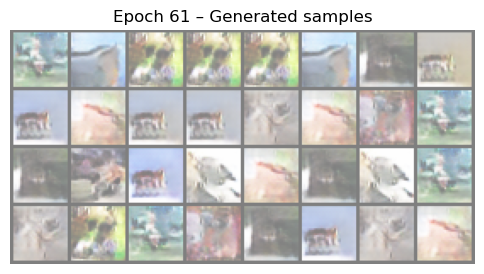

Epoch 62 finished: G=3.3042, D=1.0187


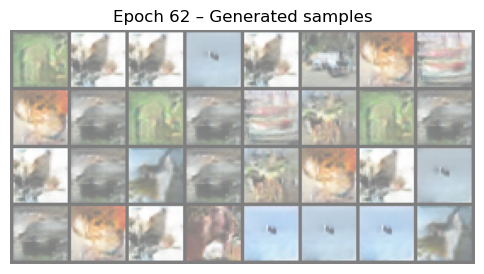

Epoch 63 finished: G=3.3242, D=1.0373


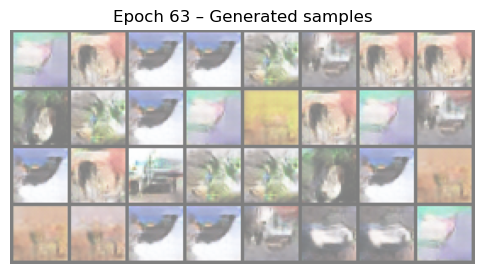

Epoch 64 finished: G=3.3441, D=1.0210


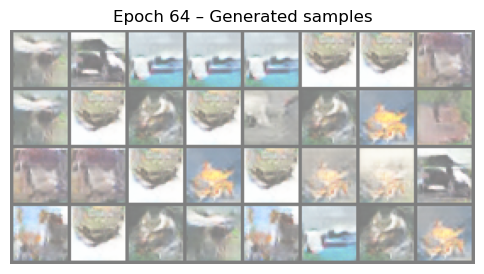

Epoch 65 finished: G=3.1698, D=1.0251


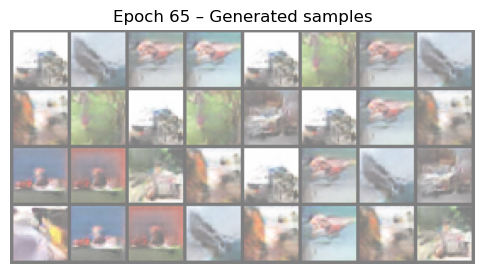

Epoch 66 finished: G=3.3344, D=0.9914


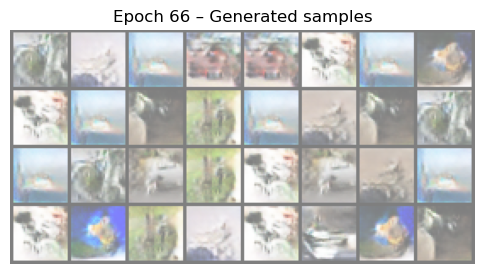

Epoch 67 finished: G=3.5697, D=0.9089


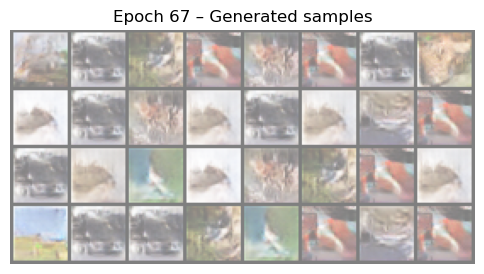

Epoch 68 finished: G=3.6598, D=0.9297


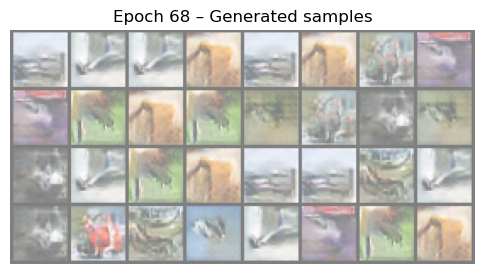

Epoch 69 finished: G=3.5668, D=0.8824


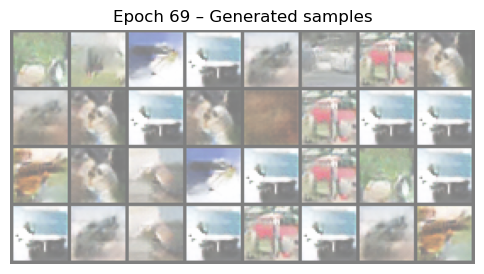

Epoch 70 finished: G=3.7576, D=0.9062


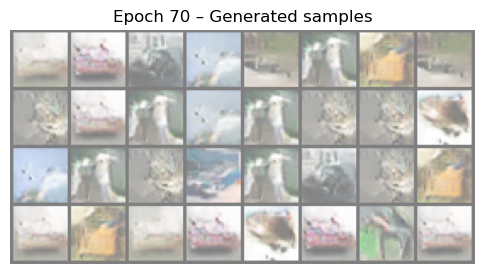

Epoch 71 finished: G=3.4173, D=0.9406


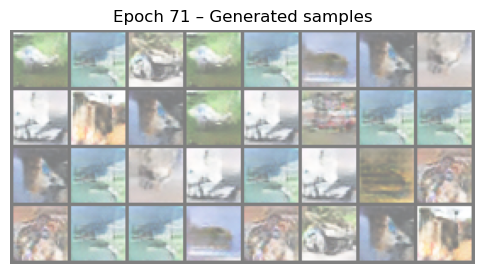

Epoch 72 finished: G=3.3759, D=0.9496


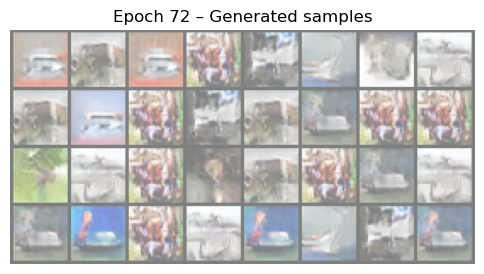

Epoch 73 finished: G=3.3652, D=0.9529


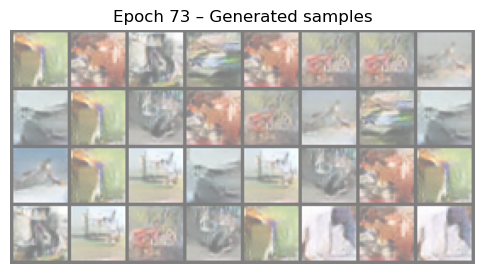

Epoch 74 finished: G=3.4220, D=0.9376


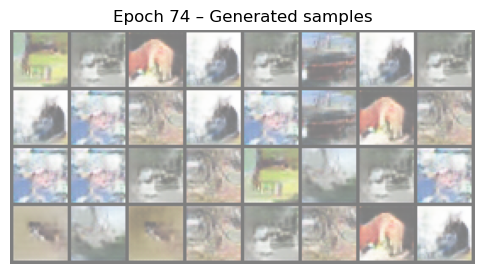

Epoch 75 finished: G=3.4836, D=0.9601


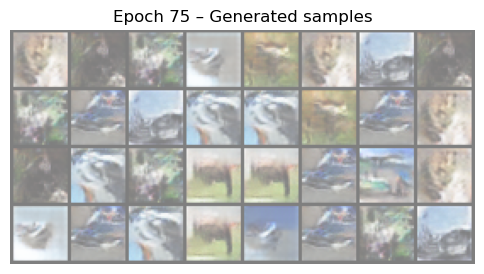

Epoch 76 finished: G=3.4561, D=0.8936


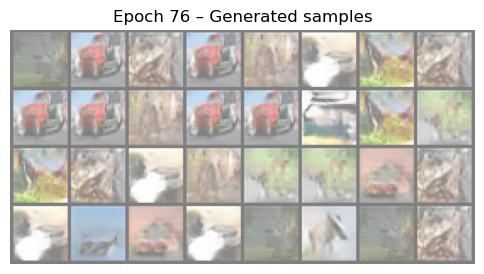

Epoch 77 finished: G=3.5003, D=0.8613


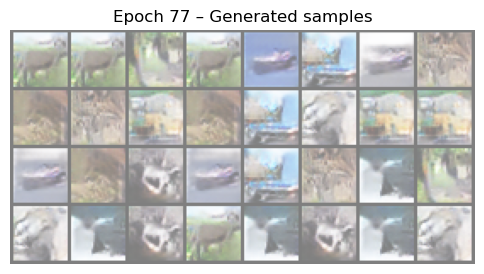

Epoch 78 finished: G=3.5263, D=0.8541


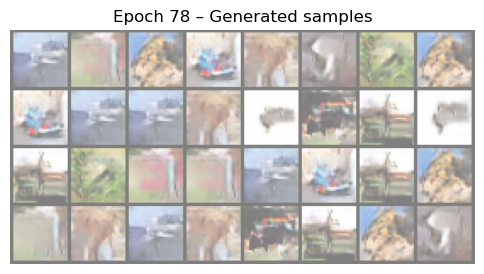

Epoch 79 finished: G=3.4530, D=0.8802


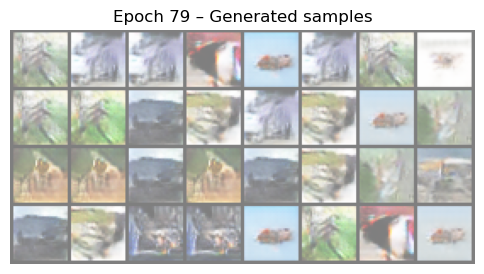

Epoch 80 finished: G=3.5634, D=0.8739


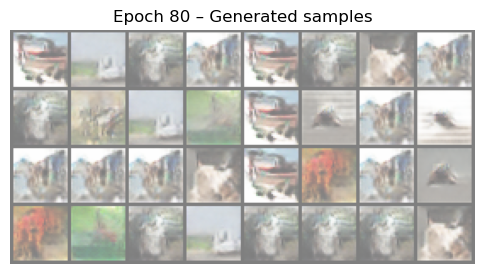

Training finished in 636.1 seconds.


In [19]:
# Cell 7: Training loop (ACGAN with aux loss on real + fake, inline plots)

step = 0
start_time = time.time()
print("======== Training ACGAN on CIFAR-10 (32x32) ========")

for epoch in range(1, EPOCHS + 1):
    G.train()
    D.train()

    running_g_loss = 0.0
    running_d_loss = 0.0

    for batch_idx, (real_imgs, real_labels) in enumerate(dataloader):
        real_imgs = real_imgs.to(DEVICE)
        real_labels = real_labels.to(DEVICE)
        batch_size = real_imgs.size(0)

        # Labels for real/fake
        real_valid = torch.ones(batch_size, device=DEVICE)
        fake_valid = torch.zeros(batch_size, device=DEVICE)

        # --------------------------
        #  Train Discriminator
        # --------------------------
        D.zero_grad()

        # Real images
        adv_real, class_real = D(real_imgs)
        d_real_adv_loss = adv_criterion(adv_real, real_valid)
        d_real_aux_loss = aux_criterion(class_real, real_labels)

        # Fake images
        z = torch.randn(batch_size, Z_DIM, 1, 1, device=DEVICE)
        fake_labels = torch.randint(0, NUM_CLASSES, (batch_size,), device=DEVICE)
        fake_imgs = G(z, fake_labels).detach()

        adv_fake, class_fake = D(fake_imgs)
        d_fake_adv_loss = adv_criterion(adv_fake, fake_valid)
        # IMPORTANT: aux loss on fake too, using the labels we asked G to generate
        d_fake_aux_loss = aux_criterion(class_fake, fake_labels)

        d_adv_loss = d_real_adv_loss + d_fake_adv_loss
        d_aux_loss = d_real_aux_loss + d_fake_aux_loss

        d_loss = d_adv_loss + AUX_LAMBDA_D * d_aux_loss
        d_loss.backward()
        d_optimizer.step()

        # --------------------------
        #  Train Generator
        # --------------------------
        G.zero_grad()

        z = torch.randn(batch_size, Z_DIM, 1, 1, device=DEVICE)
        gen_labels = torch.randint(0, NUM_CLASSES, (batch_size,), device=DEVICE)
        gen_imgs = G(z, gen_labels)

        adv_gen, class_gen = D(gen_imgs)
        g_adv_loss = adv_criterion(adv_gen, real_valid)
        g_aux_loss = aux_criterion(class_gen, gen_labels)

        g_loss = g_adv_loss + AUX_LAMBDA_G * g_aux_loss
        g_loss.backward()
        g_optimizer.step()

        running_g_loss += g_loss.item()
        running_d_loss += d_loss.item()
        step += 1

    avg_g = running_g_loss / len(dataloader)
    avg_d = running_d_loss / len(dataloader)
    print(f"Epoch {epoch} finished: G={avg_g:.4f}, D={avg_d:.4f}")

    # Show a grid at the end of each epoch
    G.eval()
    with torch.no_grad():
        # one sample per fixed_noise item, random labels
        epoch_labels = torch.randint(0, NUM_CLASSES, (fixed_noise.size(0),), device=DEVICE)
        fake_epoch = G(fixed_noise, epoch_labels)

    grid = utils.make_grid(fake_epoch, nrow=8, normalize=True, value_range=(-1, 1))
    npimg = grid.cpu().permute(1, 2, 0).numpy()

    plt.figure(figsize=(6, 6))
    plt.imshow((npimg * 0.5) + 0.5)  # denormalize
    plt.axis("off")
    plt.title(f"Epoch {epoch} – Generated samples")
    plt.show()

total_time = time.time() - start_time
print(f"Training finished in {total_time:.1f} seconds.")


In [20]:
pip install scipy


Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [21]:
# Cell 8: FID utilities (requires: pip install scipy)

import numpy as np
from torchvision.models import inception_v3, Inception_V3_Weights
from torch.nn import functional as F
from scipy import linalg

# Inception v3 feature extractor (pool layer)
# NOTE: don't pass aux_logits here, let it use the default (True)
inception = inception_v3(
    weights=Inception_V3_Weights.IMAGENET1K_V1,
    transform_input=False,
)
# We only want the final features, not the classifier
inception.fc = nn.Identity()
inception.to(DEVICE)
inception.eval()


@torch.no_grad()
def get_inception_activations_from_real(dataloader, n_samples=5000):
    """Collect Inception features for real images."""
    activations = []
    total = 0

    for imgs, _ in dataloader:
        imgs = imgs.to(DEVICE)

        # Resize to 299x299 as Inception expects
        imgs = F.interpolate(imgs, size=(299, 299), mode="bilinear", align_corners=False)

        # Inception expects 3 channels, so if grayscale repeat channels
        if imgs.shape[1] == 1:
            imgs = imgs.repeat(1, 3, 1, 1)

        feats = inception(imgs)
        feats = feats.detach().cpu().numpy()
        activations.append(feats)

        total += feats.shape[0]
        if total >= n_samples:
            break

    activations = np.concatenate(activations, axis=0)
    return activations[:n_samples]


@torch.no_grad()
def get_inception_activations_from_generator(G, n_samples=5000, num_classes=10, z_dim=100, batch_size=128):
    """Collect Inception features for generated images."""
    activations = []
    total = 0

    while total < n_samples:
        cur_batch = min(batch_size, n_samples - total)
        z = torch.randn(cur_batch, z_dim, 1, 1, device=DEVICE)
        labels = torch.randint(0, num_classes, (cur_batch,), device=DEVICE)

        fake_imgs = G(z, labels)

        # Resize to 299x299
        fake_imgs = F.interpolate(fake_imgs, size=(299, 299), mode="bilinear", align_corners=False)

        if fake_imgs.shape[1] == 1:
            fake_imgs = fake_imgs.repeat(1, 3, 1, 1)

        feats = inception(fake_imgs)
        feats = feats.detach().cpu().numpy()
        activations.append(feats)
        total += feats.shape[0]

    activations = np.concatenate(activations, axis=0)
    return activations[:n_samples]


def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Frechet distance between two Gaussians (used for FID)."""
    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    diff = mu1 - mu2

    # Product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        print("FID: Adding epsilon to diagonal of covariances for stability.")
        offset = np.eye(sigma1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    # Numerical error might give small imaginary parts
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    fid = (diff.dot(diff) +
           np.trace(sigma1) +
           np.trace(sigma2) -
           2 * tr_covmean)
    return float(fid)


def compute_fid(G, dataloader, n_samples=5000):
    """Compute FID between real images and images generated by G."""
    print(f"Computing FID on {n_samples} real and {n_samples} fake samples...")

    G.eval()

    real_acts = get_inception_activations_from_real(dataloader, n_samples=n_samples)
    fake_acts = get_inception_activations_from_generator(
        G,
        n_samples=n_samples,
        num_classes=NUM_CLASSES,
        z_dim=Z_DIM,
        batch_size=128
    )

    mu_real = np.mean(real_acts, axis=0)
    sigma_real = np.cov(real_acts, rowvar=False)

    mu_fake = np.mean(fake_acts, axis=0)
    sigma_fake = np.cov(fake_acts, rowvar=False)

    fid_value = calculate_frechet_distance(mu_real, sigma_real, mu_fake, sigma_fake)
    print(f"FID (N={n_samples}): {fid_value:.4f}")
    return fid_value


In [22]:
# Cell 9: Run FID computation after training

# You can lower n_samples (e.g., 2000) if it's too slow
fid_score = compute_fid(G, dataloader, n_samples=5000)
print("Average FID score:", fid_score)


Computing FID on 5000 real and 5000 fake samples...
FID (N=5000): 235.2928
Average FID score: 235.29282934892564


Top-10 discriminator scores: [6.0326724 4.596645  4.555606  3.6847856 3.6586616 3.5739985 3.4548209
 3.443426  3.4164057 3.3674676]


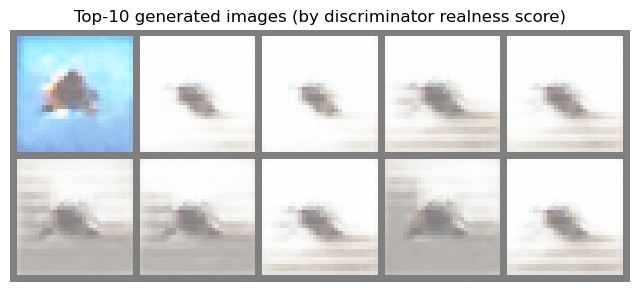

In [23]:
# Cell 10: Generate 10 "best" images by discriminator score

G.eval()
D.eval()

N_GENERATED = 1000   # how many random candidates to sample
BATCH_SIZE_EVAL = 128

all_images = []
all_scores = []

with torch.no_grad():
    remaining = N_GENERATED
    while remaining > 0:
        cur_batch = min(BATCH_SIZE_EVAL, remaining)
        z = torch.randn(cur_batch, Z_DIM, 1, 1, device=DEVICE)
        labels = torch.randint(0, NUM_CLASSES, (cur_batch,), device=DEVICE)

        fake_imgs = G(z, labels)
        adv_logits, _ = D(fake_imgs)

        all_images.append(fake_imgs.cpu())
        all_scores.append(adv_logits.cpu())

        remaining -= cur_batch

# Stack them
all_images = torch.cat(all_images, dim=0)  # (N_GENERATED, C, H, W)
all_scores = torch.cat(all_scores, dim=0)  # (N_GENERATED,)

# Top-10 indices by score
topk = 10
top_scores, top_idx = torch.topk(all_scores, k=topk)

best_images = all_images[top_idx]

print("Top-10 discriminator scores:", top_scores.numpy())

# Make a grid of the 10 best images
grid_best = utils.make_grid(best_images, nrow=5, normalize=True, value_range=(-1, 1))

npimg_best = grid_best.permute(1, 2, 0).numpy()
plt.figure(figsize=(8, 4))
plt.imshow((npimg_best * 0.5) + 0.5)
plt.axis("off")
plt.title("Top-10 generated images (by discriminator realness score)")
plt.show()
